### New York City Airbnb data
#### EDA y limpieza de datos

In [1]:
import numpy as np 
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px
import warnings
import folium
from folium import plugins
from folium.plugins import MarkerCluster
from folium.plugins import FastMarkerCluster
from folium.plugins import HeatMap

In [2]:
df = pd.read_csv('../data/raw/AB_NYC_2019.csv')

In [3]:
warnings.filterwarnings('ignore')

**Ver las variables y una muestra de su contenido**

In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 48895 entries, 0 to 48894
Data columns (total 16 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   id                              48895 non-null  int64  
 1   name                            48879 non-null  object 
 2   host_id                         48895 non-null  int64  
 3   host_name                       48874 non-null  object 
 4   neighbourhood_group             48895 non-null  object 
 5   neighbourhood                   48895 non-null  object 
 6   latitude                        48895 non-null  float64
 7   longitude                       48895 non-null  float64
 8   room_type                       48895 non-null  object 
 9   price                           48895 non-null  int64  
 10  minimum_nights                  48895 non-null  int64  
 11  number_of_reviews               48895 non-null  int64  
 12  last_review                     

In [5]:
df.sample(5)

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
44126,34056750,Wyndham Midtown 45 at New York City,91854658,Genevieve,Manhattan,Midtown,40.75196,-73.97269,Entire home/apt,500,4,0,NaN,NaN,1,5
1121,476527,1RW- CARRIAGE HOUSE STUDIO OFF CTYD,2027013,Adam,Manhattan,East Village,40.72893,-73.98278,Entire home/apt,89,30,57,2019-05-05,0.67,6,0
32328,25293702,Cozy (☆) Room In Upper Manhattan (♥),110191144,Mamadou,Manhattan,Harlem,40.82201,-73.95444,Private room,75,2,19,2019-06-12,1.40,2,84
32879,25909161,New York Oasis,32605338,Aliesha,Manhattan,Upper East Side,40.76917,-73.95160,Entire home/apt,150,4,11,2019-05-23,1.13,1,3
26206,20896858,Harlem Cozy Studio,71375344,Roselin,Manhattan,Harlem,40.81301,-73.94502,Entire home/apt,125,4,9,2019-06-08,0.94,1,245


**Ajustar el tipo de cada variable**

In [6]:
df['last_review'] = df['last_review'].astype('datetime64[ns]')

In [7]:
df=df.astype({'name':'str','host_name':'str','neighbourhood_group':'category','neighbourhood':'category','room_type':'category'})

**Ver un resumen de las variables numéricas**

In [8]:
df.describe()

,id,host_id,latitude,longitude,price,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_365
count,4.889500e+04,4.889500e+04,48895.000000,48895.000000,48895.000000,48895.000000,48895.000000,38843.000000,48895.000000,48895.000000
mean,1.901714e+07,6.762001e+07,40.728949,-73.952170,152.720687,7.029962,23.274466,1.373221,7.143982,112.781327
std,1.098311e+07,7.861097e+07,0.054530,0.046157,240.154170,20.510550,44.550582,1.680442,32.952519,131.622289
min,2.539000e+03,2.438000e+03,40.499790,-74.244420,0.000000,1.000000,0.000000,0.010000,1.000000,0.000000
25%,9.471945e+06,7.822033e+06,40.690100,-73.983070,69.000000,1.000000,1.000000,0.190000,1.000000,0.000000
50%,1.967728e+07,3.079382e+07,40.723070,-73.955680,106.000000,3.000000,5.000000,0.720000,1.000000,45.000000
75%,2.915218e+07,1.074344e+08,40.763115,-73.936275,175.000000,5.000000,24.000000,2.020000,2.000000,227.000000
max,3.648724e+07,2.743213e+08,40.913060,-73.712990,10000.000000,1250.000000,629.000000,58.500000,327.000000,365.000000


**Observaciones:**

- Los valores máximos y mínimos de latitud y longitud son correctos para la Ciudad de Nueva York. --> Ver esto en un mapa.

- El precio mínimo es 0. --> Sustituir precio 0 por un promedio para el tipo de alojamiento y distrito.

- Precio máximo de 10000 llama la atención, pero podría ser correcto. --> Revisar si los precios más altos son razonables para el tipo de alojamiento y zona.

- Es razonable que el mínimo de noches sea 1, pero un mínimo de 1250 noches no parece ser correcto. --> Decidir qué hacer con este y otros posibles valores extremos, en función del análisis que se haga sobre esta variable.

- La cantidad de reviews va de 0 a 629. Sin embargo la cantidad mínima de reviews por mes es 0.01. --> Revisar si esto tiene que ver con el hecho de que hay valores nulos en la cantidad de reviews por mes.

- calculated_host_listings_count corresponde a la cantidad de alojamientos que tiene un mismo host. Los valores más comunes son 1 y 2, el máximo es 327. --> Buscar características particulares de los alojamientos de los hosts que tienen mayor cantidad.

- availability_365 parece ser la disponibilidad en el año. En tal caso, llama la atención que al menos el 25% de los alojamientos no están disponibles --> Buscar características particulares de los alojamientos que no están disponibles

**Ubicación de los alojamientos**

In [9]:
Long = -73.95
Lat = 40.73
locations = list(zip(df.latitude, df.longitude))

map1 = folium.Map(location=[Lat,Long], zoom_start=10)
FastMarkerCluster(data=locations).add_to(map1)
map1

**Sustituir precio 0 por un promedio para el tipo de alojamiento y barrio.**

In [10]:
# Obtener el precio promedio (excluyendo los valores nulos) por zona y tipo de alojamiento
df_precio_no_nulo = df[df['price'] > 0]
df_precio_promedio = df_precio_no_nulo.groupby(['room_type','neighbourhood_group'])['price'].mean().sort_values(ascending=True)
pd.DataFrame(df_precio_promedio).sort_values(by='room_type')
dict_precios_promedio = df_precio_promedio.to_dict()

In [11]:
def precio_nulo_a_promedio(fila):
	if fila['price'] > 0:
		return fila['price']
	else:
		return dict_precios_promedio[fila['room_type'], fila['neighbourhood_group']]

In [12]:
df['price'] = df.apply(precio_nulo_a_promedio, axis=1)

**Boxplot de precios**

In [13]:
fig = px.box(df, x='price')
fig.show()

Hay valores muy por fuera del rango no atípico.
La cantidad de valores atípicos va disminuyendo al aumentar el precio.

**Histograma de precios** (sin considerar outliers)

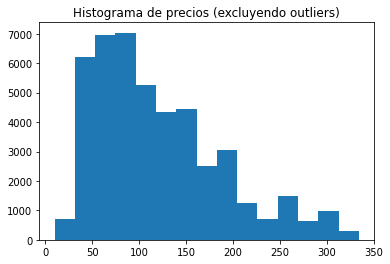

In [14]:
q1_pr = df['price'].quantile(0.25)
q3_pr = df['price'].quantile(0.75)
IQR_pr = q3_pr - q1_pr
min_pr = q1_pr - 1.5*IQR_pr
max_pr = q3_pr + 1.5*IQR_pr
df_sin_outliers = df[(df['price']>=min_pr) & (df['price']<=max_pr)]
plt.hist(df_sin_outliers.price, bins=15)
plt.title('Histograma de precios (excluyendo outliers)')
plt.show()

**Análisis del precio promedio por tipo de alojamiento y distrito**

In [15]:
df_precio_promedio = df.groupby(['room_type','neighbourhood_group'])['price'].mean().sort_values(ascending=True)
pd.DataFrame(df_precio_promedio).sort_values(by=['room_type', 'price'])

price
room_type       neighbourhood_group            
Entire home/apt Bronx                127.506596
                Queens               147.050573
                Staten Island        173.846591
                Brooklyn             178.346202
                Manhattan            249.257994
Private room    Staten Island         62.292553
                Bronx                 66.890937
                Queens                71.762456
                Brooklyn              76.545428
                Manhattan            116.776622
Shared room     Brooklyn              50.773723
                Staten Island         57.444444
                Bronx                 59.800000
                Queens                69.020202
                Manhattan             88.977083

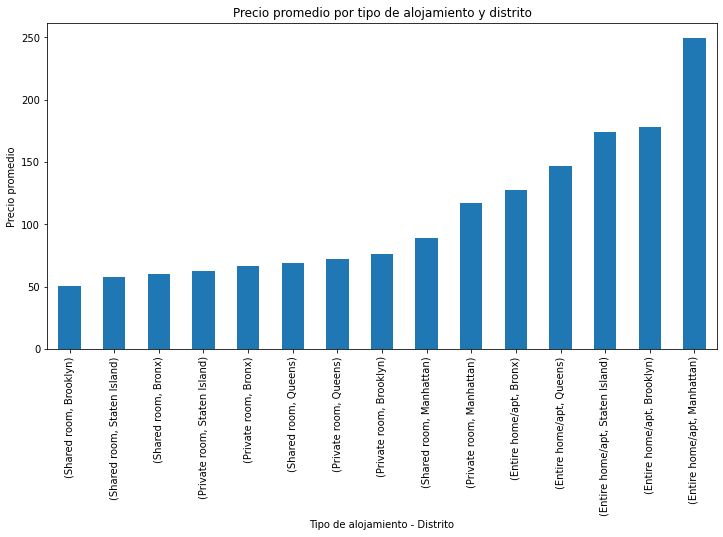

In [16]:
plt.figure(figsize=(12,6))
df_precio_promedio.plot(kind='bar')
plt.title('Precio promedio por tipo de alojamiento y distrito')
plt.ylabel('Precio promedio')
plt.xlabel('Tipo de alojamiento - Distrito')
plt.show()

Para todos los distritos el precio promedio para una habitación compartida es menor que el precio promedio para una habitación privada, y este a su vez es menor que el precio de un apartamento entero.

Para todos los tipos de habitación el precio promedio es más alto en Manhattan que en los otros distritos. 

**Análisis del precio según la ubicación**

In [17]:
q1_pr = df['price'].quantile(q=0.25)
q2_pr = df['price'].quantile(q=0.5)
q3_pr = df['price'].quantile(q=0.75)

def categoria_precio(precio):
  if precio <= q1_pr:
    return 'min - q1'
  elif precio <= q2_pr:
    return 'q1 - q2'
  elif precio <= q3_pr:
    return 'q2 - q3'
  else:
    return 'q3 - max'

df['Price_category'] = df['price'].apply(categoria_precio).astype('category')

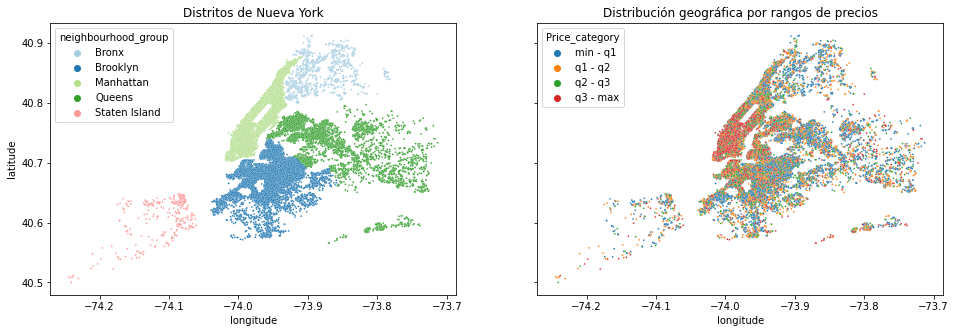

In [18]:
plt.subplots(1, 2, sharex=True, sharey=True, figsize=(16, 5))
plt.subplot(1, 2, 1)
sns.scatterplot(x=df.longitude, y=df.latitude, hue=df.neighbourhood_group, s=3, palette='Paired')
plt.title('Distritos de Nueva York')
plt.subplot(1, 2, 2)
sns.scatterplot(x=df.longitude, y=df.latitude, hue=df.Price_category, hue_order=['min - q1', 'q1 - q2', 'q2 - q3', 'q3 - max'], s=3)
plt.title('Distribución geográfica por rangos de precios')
plt.show()

Los precios más altos (rojo) se concentran en el extremo sur de Manhattan. Los precios intermedios (amarillo, verde) se ubican sobre todo en zonas aledañas a ésta. En líneas generales, el precio va disminuyendo (mayor proporción de azul) a medida que aumenta la distancia a esta zona central. 

**Análisis de precios en Manhattan**

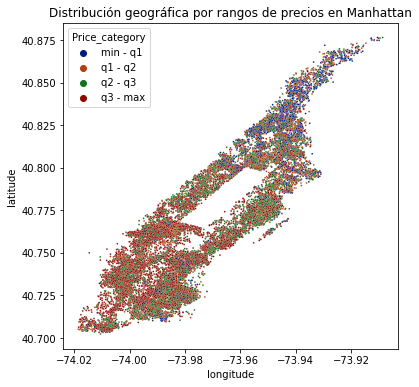

In [19]:
df_manhattan = df[df['neighbourhood_group']=='Manhattan']
df_manhattan['Price_category'] = df_manhattan['price'].apply(categoria_precio).astype('category')

plt.figure(figsize=(6, 6))
sns.scatterplot(x=df_manhattan.longitude, y=df_manhattan.latitude, hue=df_manhattan.Price_category, hue_order=['min - q1', 'q1 - q2', 'q2 - q3', 'q3 - max'], s=3, palette='dark')
plt.title('Distribución geográfica por rangos de precios en Manhattan')
plt.show()

# Los rangos de precios son dentro de Manhattan (el máximo es el máximo para Manhattan, no para todos los distritos)

En Manhattan se observa un gradiente en los precios, siendo más altos (en general) en los barrios del sur que en los del norte.

**Ubicación correspondiente a los precios atípicos**

In [20]:
df_outliers = df[(df['price']>=max_pr) | (df['price']<=min_pr)]

df_outliers['Categoria_outliers_precio'] = 'Precios más altos (outliers)'
df_outliers['Categoria_outliers_precio'] = df_outliers['Categoria_outliers_precio'].astype('category')

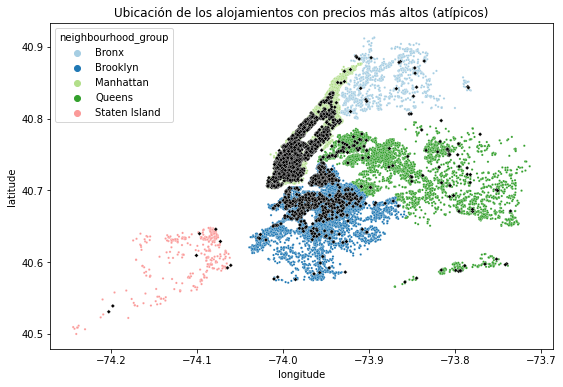

In [21]:
color = ['k']

plt.figure(figsize=(9,6))
sns.scatterplot(x=df.longitude, y=df.latitude, hue=df.neighbourhood_group, s=5, palette='Paired')
sns.scatterplot(x=df_outliers.longitude, y=df_outliers.latitude, hue=df_outliers.Categoria_outliers_precio, palette=color, s=8, marker='D', legend=False)
plt.title('Ubicación de los alojamientos con precios más altos (atípicos)')
plt.show()

Los precios que se salen del rango típico (indicados en negro) se concentran en el extremo sur de Manhattan y zonas aledañas, lo cual coincide con el plot anterior. 
Además son las zonas con mayor densidad de alojamientos en general, por lo tanto es razonable esperar que también haya mayor densidad de alojamientos con precios altos.

**Tipo de alojamiento correspondiente a los precios atípicos**

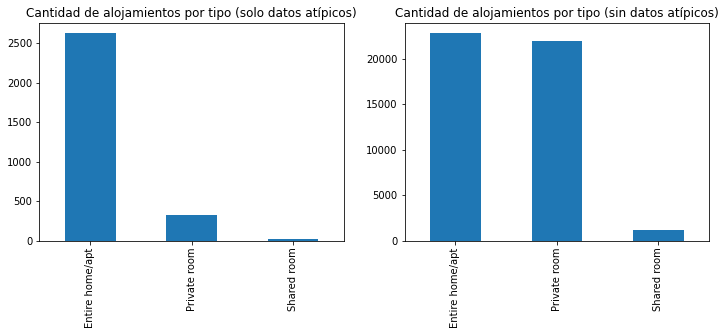

In [22]:
plt.subplots(1, 2, figsize=(12,4))
plt.subplot(1, 2, 1)
df_outliers['room_type'].value_counts().plot(kind='bar')
plt.title('Cantidad de alojamientos por tipo (solo datos atípicos)')
plt.subplot(1, 2, 2)
df_sin_outliers['room_type'].value_counts().plot(kind='bar')
plt.title('Cantidad de alojamientos por tipo (sin datos atípicos)')
plt.show()

La proporción de apartamentos o casas es mucho mayor para los outliers que para el resto de datos. Esto significa que el precio tan elevado no depende solo de la ubicación sino también del tipo de alojamiento.

**Análisis de valores atípicos de mínimo de noches**

In [23]:
fig = px.box(df, x='minimum_nights')
fig.show()

**Análisis de reviews**

In [29]:
print(f"Hay {len(df.loc[df['number_of_reviews']==0])} filas con 0 reviews y {df['reviews_per_month'].isna().sum()} filas con nan en reviews por mes")

Hay 10052 filas con 0 reviews y 10052 filas con nan en reviews por mes


La cantidad de filas en las cuales hay 0 reviews es igual a la cantidad de filas que tienen nan en reviews por mes. Esto parece indicar que nan debería ser 0 en realidad.
Para confirmar que estos valores se corresponden:

In [30]:
df.loc[df['number_of_reviews']==0]['reviews_per_month'].isna().sum()

10052

Como efectivamente coincide, cambio los nan de reviews_per_month por 0

In [31]:
df['reviews_per_month'] = df['reviews_per_month'].fillna(0)

In [24]:
np.all(np.isnat(np.array(df.loc[df['number_of_reviews']==0]['last_review'])))

True

En todos los casos en los que hay 0 reviews, no hay fecha de last_review.
Faltaría ver que se cumpla que en todos los casos que no hay fecha de last_review es porque hay 0 reviews. Para esto alcanza con ver que hay la misma cantidad de naT que de 0 reviews:

In [33]:

np.size(np.isnat(np.array(df.loc[df['number_of_reviews']==0]['last_review']))) == len(df.loc[df['number_of_reviews']==0])

True

Se puede afirmar entonces que no falta ningún dato para la fecha de última review, los casos en los que no hay un valor es porque no tiene reviews.

**Histograma de total de reviews por host** 

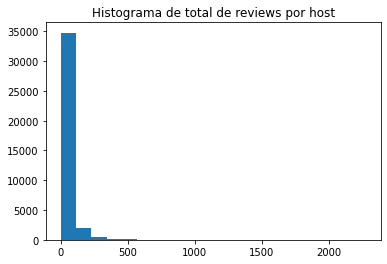

In [26]:
df_reviews = df.groupby('host_id').agg({'number_of_reviews': np.sum, 'id': pd.Series.nunique})
pd.DataFrame(df_reviews)

plt.hist(df_reviews['number_of_reviews'], bins=20)
plt.title('Histograma de total de reviews por host')
plt.show()

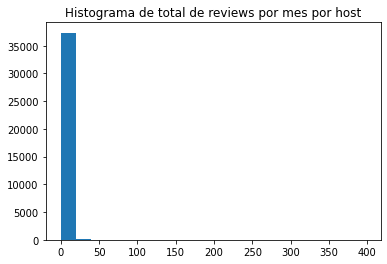

In [27]:
df_reviews_month = df.groupby('host_id').agg({'reviews_per_month': np.sum, 'id': pd.Series.nunique})
pd.DataFrame(df_reviews_month)

plt.hist(df_reviews_month['reviews_per_month'], bins=20)
plt.title('Histograma de total de reviews por mes por host')
plt.show()

A excepción del caso del host con mayor cantidad de alojamientos, un patrón similar al anterior se ve en las reviews por mes.

**Ubicación de los alojamientos no disponibles**

In [35]:
df_no_disponible = df[df['availability_365']==0]
df_no_disponible['Categoria_disponibilidad'] = 'No disponible'
df_no_disponible['Categoria_disponibilidad'] = df_no_disponible['Categoria_disponibilidad'].astype('category')

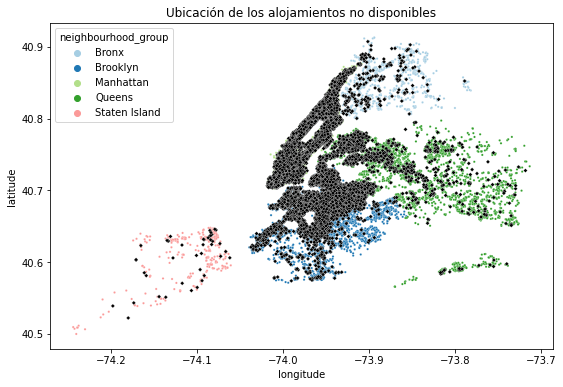

In [51]:
color = ['k']

plt.figure(figsize=(9,6))
sns.scatterplot(x=df.longitude, y=df.latitude, hue=df.neighbourhood_group, s=5, palette='Paired')
sns.scatterplot(x=df_no_disponible.longitude, y=df_no_disponible.latitude, hue=df_no_disponible.Categoria_disponibilidad, palette=color, s=8, marker='D', legend=False)
plt.title('Ubicación de los alojamientos no disponibles')
plt.show()

La distribución se ve similar a la de los precios más altos. Para verlo mejor se puede ver ambas cosas en un mismo plot:

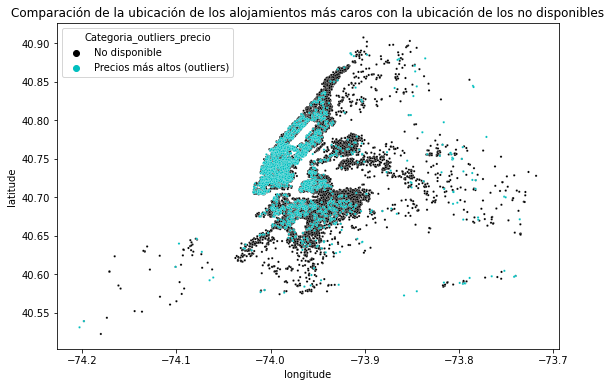

In [52]:
color = ['k']
color2 = ['c']

plt.figure(figsize=(9,6))
sns.scatterplot(x=df_no_disponible.longitude, y=df_no_disponible.latitude, hue=df_no_disponible.Categoria_disponibilidad, palette=color, s=5, legend=True)
sns.scatterplot(x=df_outliers.longitude, y=df_outliers.latitude, hue=df_outliers.Categoria_outliers_precio, palette=color2, s=5, legend=True)
plt.title('Comparación de la ubicación de los alojamientos más caros con la ubicación de los no disponibles')
plt.show()

**Comparación del precio promedio (por tipo de alojamiento y distrito) según disponibilidad**

In [28]:
df_no_disponible = df[df['availability_365']==0]
df_precio_promedio_no_disponible = df_no_disponible.groupby(['room_type','neighbourhood_group'])['price'].mean().sort_values(ascending=True)
pd.DataFrame(df_precio_promedio_no_disponible).sort_values(by=['room_type', 'price'])

price
room_type       neighbourhood_group            
Entire home/apt Bronx                105.737705
                Queens               123.507326
                Staten Island        155.291667
                Brooklyn             161.987668
                Manhattan            215.625947
Private room    Bronx                 67.245283
                Brooklyn              70.726503
                Staten Island         74.588235
                Queens                80.707379
                Manhattan            100.047188
Shared room     Staten Island         20.000000
                Bronx                 52.800000
                Brooklyn              60.980952
                Queens                85.222222
                Manhattan             99.381944

In [29]:
df_disponible = df[df['availability_365']>0]
df_precio_promedio_disponible = df_disponible.groupby(['room_type','neighbourhood_group'])['price'].mean().sort_values(ascending=True)
pd.DataFrame(df_precio_promedio_disponible).sort_values(by=['room_type', 'price'])

price
room_type       neighbourhood_group            
Entire home/apt Bronx                131.682390
                Queens               155.343871
                Staten Island        176.776316
                Brooklyn             187.740505
                Manhattan            268.215614
Private room    Staten Island         61.070175
                Bronx                 66.822145
                Queens                69.043697
                Brooklyn              80.753262
                Manhattan            127.971560
Shared room     Brooklyn              47.293985
                Bronx                 61.200000
                Staten Island         62.125000
                Queens                65.419753
                Manhattan             84.517857

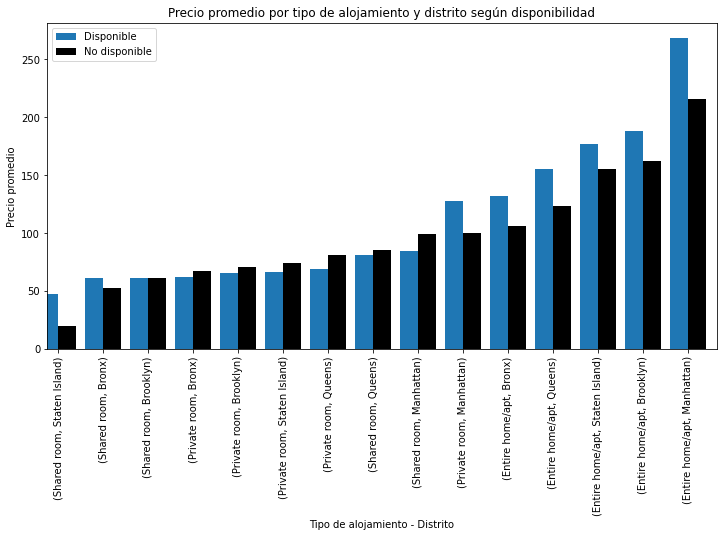

In [55]:
plt.figure(figsize=(12,6))
df_precio_promedio_disponible.plot(kind='bar', width=-0.4, align='edge')
df_precio_promedio_no_disponible.plot(kind='bar', color='k', width=0.4, align='edge')
plt.legend(['Disponible', 'No disponible'])
plt.title('Precio promedio por tipo de alojamiento y distrito según disponibilidad')
plt.ylabel('Precio promedio')
plt.xlabel('Tipo de alojamiento - Distrito')
plt.show()

En el extremo de los precios más altos el precio promedio de los alojamientos no disponibles es menor que el de los que sí están disponibles. Esto puede deberse a un intento de atraer la atención hacia los alojamientos más caros, haciéndolos parecer menos costosos de lo que realmente son.
Otra posibilidad es que los precios estén desactualizados debido a que el alojamiento lleva mucho tiempo sin estar disponible.

In [37]:
df_no_disponible['last_review'].sample(50)

# Ver si muchos de los no disponibles tienen last review en 2017 o antes
# Sacar el año usando que es tipo fecha.
# Filtrar por los que tienen año <= 2017 y ver cuántos son en proporción (total_antes_2017 / total_no_disponibles)

4987           NaT
11546          NaT
34651   2019-05-19
20557   2018-01-02
22648   2018-05-06
29806          NaT
20760          NaT
27796   2019-01-04
40493   2019-01-20
8497    2015-08-23
11654          NaT
17670   2016-12-26
11150          NaT
28152   2019-05-18
37348          NaT
28943   2019-01-09
8251           NaT
11594   2018-05-28
12872          NaT
8178    2017-05-27
16574   2018-08-28
28909   2019-06-16
30238          NaT
32415   2018-09-11
34656   2019-04-01
6710           NaT
15145   2016-08-29
18085   2019-01-02
9316    2015-09-07
3617           NaT
35301   2019-01-02
20599   2016-12-26
12938          NaT
9065    2016-08-13
32573   2018-06-09
15768   2016-08-07
6136    2015-01-06
9585           NaT
7930           NaT
28926   2018-02-13
39957   2019-01-02
18667   2017-09-26
37963   2018-12-29
26233   2019-02-11
42946          NaT
21212   2017-03-07
34694   2018-10-31
39103   2019-06-16
15840   2016-05-13
27956   2018-10-28
Name: last_review, dtype: datetime64[ns]